In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from PIL import Image
import io
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import Lasso, Ridge
from reservoirpy.nodes import Reservoir, Ridge
from fbm import FBM


# Set global font properties
plt.rcParams.update({
    'font.size': 16,            # Default font size for text
    'axes.titlesize': 18,       # Font size for titles
    'axes.labelsize': 16,       # Font size for x and y labels
    'xtick.labelsize': 14,      # Font size for x-axis tick labels
    'ytick.labelsize': 14,      # Font size for y-axis tick labels
    'legend.fontsize': 14,      # Font size for legend text
    'font.family': 'serif',     # Font family
    'font.serif': ['Times New Roman'],  # Use Times New Roman font
    'figure.dpi': 250, # Adjust DPI as needed (e.g., 150, 200, etc.)
})


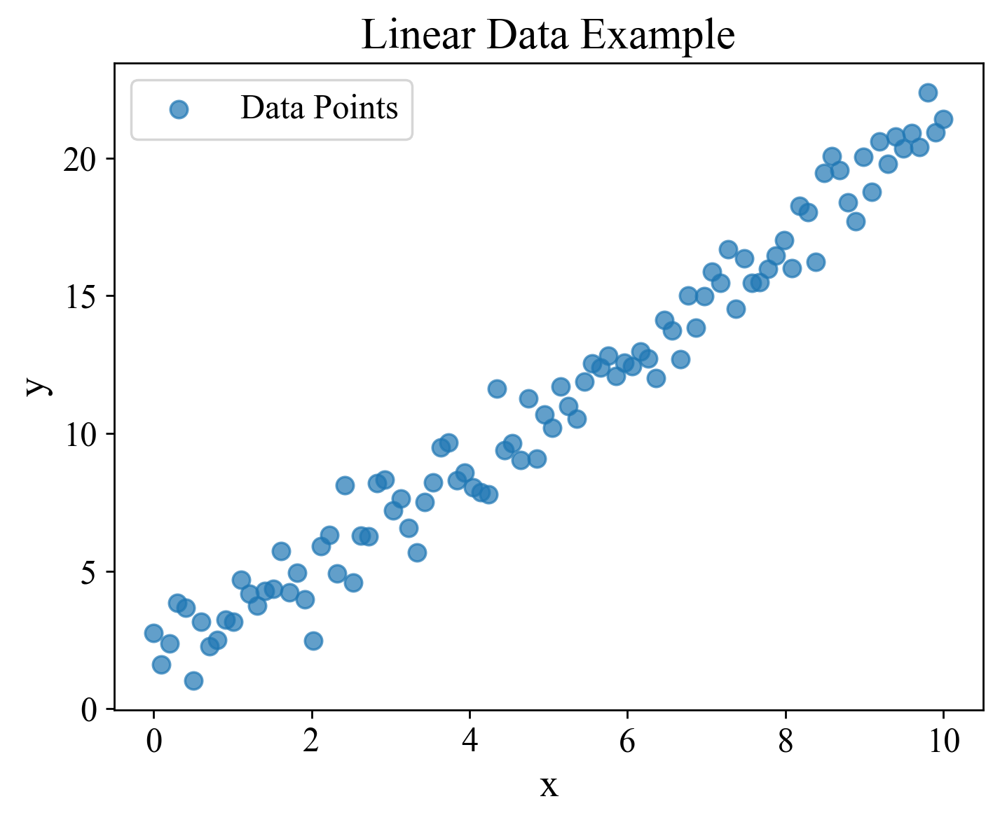

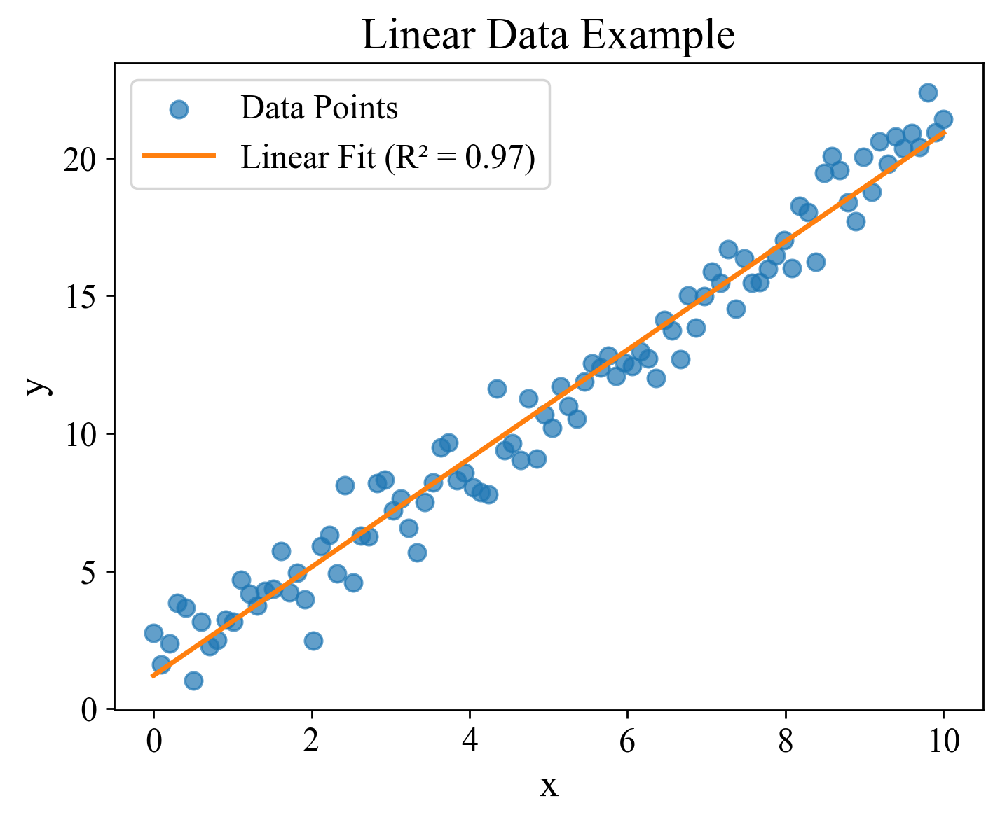

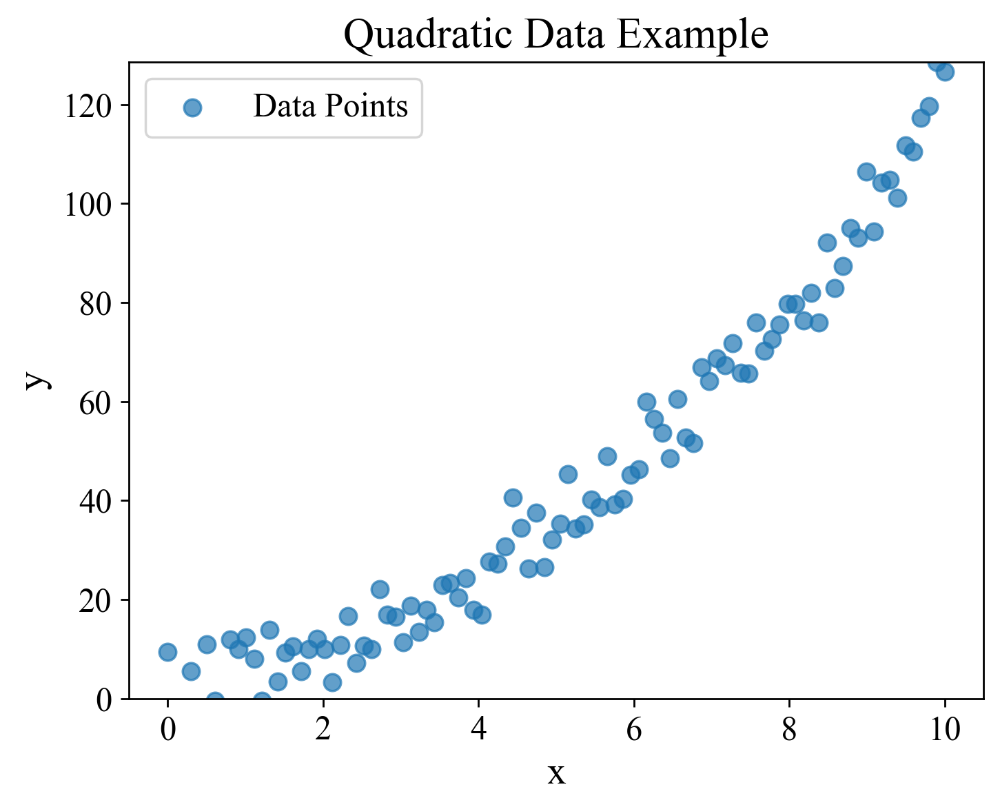

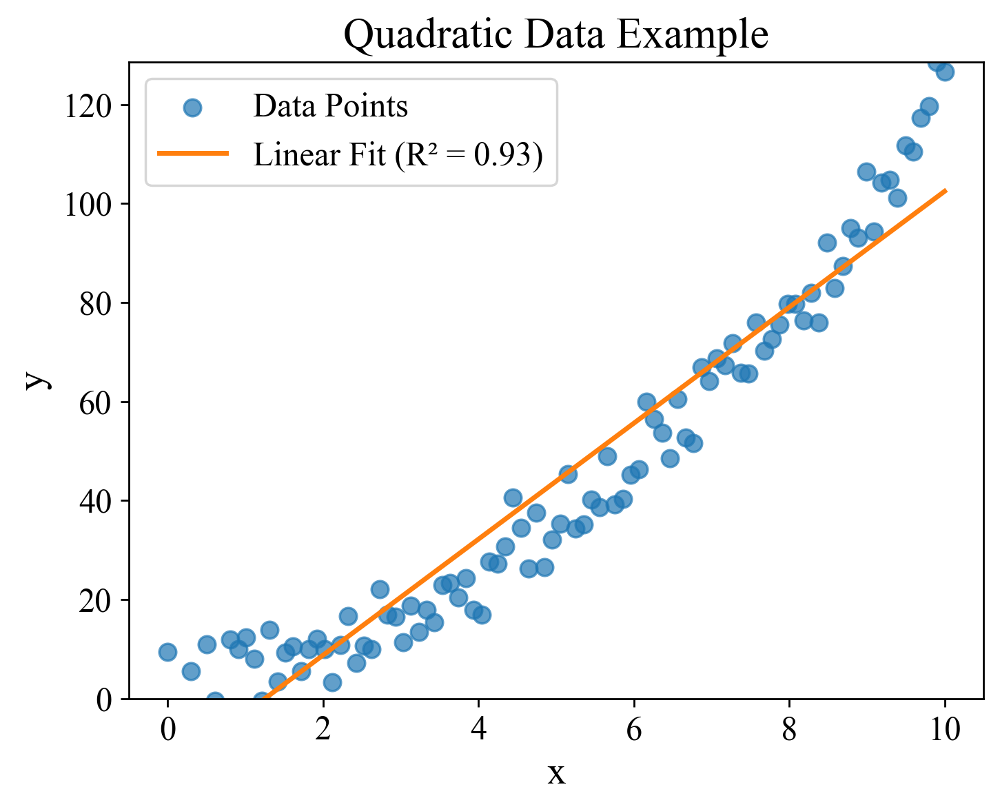

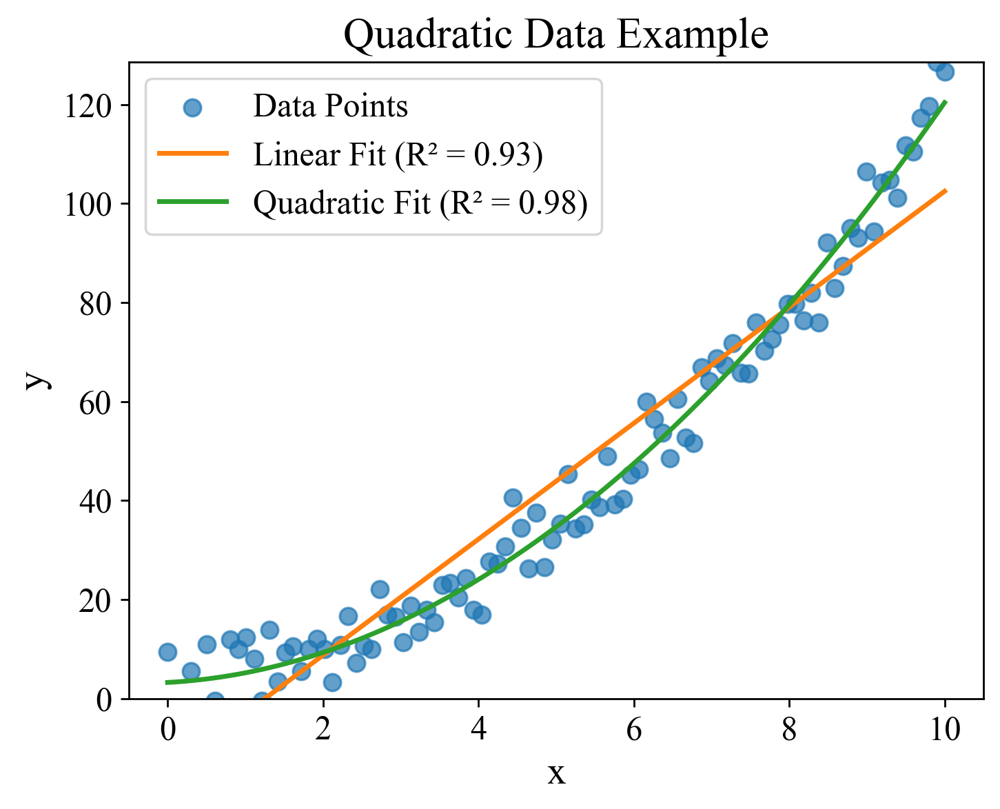

In [4]:
# Set style for visually appealing plots
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Distinct colors for better contrast

# Generate data for linear and quadratic examples
np.random.seed(0)
x = np.linspace(0, 10, 100).reshape(-1, 1)
y_linear = 2 * x + 1 + np.random.normal(0, 1, x.shape)
y_quad = x**2 + 2 * x + np.random.normal(0, 5, x.shape)

# Linear model fit for linear data
lin_reg = LinearRegression()
lin_reg.fit(x, y_linear)
y_pred_linear = lin_reg.predict(x)
r2_linear = r2_score(y_linear, y_pred_linear)

# Linear model fit for quadratic data
lin_reg.fit(x, y_quad)
y_pred_linear_quad = lin_reg.predict(x)
r2_linear_quad = r2_score(y_quad, y_pred_linear_quad)

# Quadratic model fit for quadratic data
poly = PolynomialFeatures(degree=2)
x_quad_poly = poly.fit_transform(x)
lin_reg.fit(x_quad_poly, y_quad)
y_pred_quad = lin_reg.predict(x_quad_poly)
r2_quad = r2_score(y_quad, y_pred_quad)

# Plot 1: Linear data only
plt.figure()
plt.scatter(x, y_linear, color=colors[0], s=50, alpha=0.7, label='Data Points')
plt.title('Linear Data Example')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()


# Plot 2: Linear data with linear fit
plt.figure()
plt.scatter(x, y_linear, color=colors[0], s=50, alpha=0.7, label='Data Points')
plt.plot(x, y_pred_linear, color=colors[1], linewidth=2, label=f'Linear Fit (R² = {r2_linear:.2f})')
plt.title('Linear Data Example')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

# Plot 3: Quadratic data only
plt.figure()
plt.scatter(x, y_quad, color=colors[0], s=50, alpha=0.7, label='Data Points')
plt.title('Quadratic Data Example')
plt.xlabel('x')
plt.ylabel('y')
plt.ylim(min(x),max(y_quad))
plt.legend()
plt.show()

# Plot 4: Quadratic data with linear fit
plt.figure()
plt.scatter(x, y_quad, color=colors[0], s=50, alpha=0.7, label='Data Points')
plt.plot(x, y_pred_linear_quad, color=colors[1], linewidth=2, label=f'Linear Fit (R² = {r2_linear_quad:.2f})')
plt.title('Quadratic Data Example')
plt.xlabel('x')
plt.ylabel('y')
plt.ylim(min(x),max(y_quad))
plt.legend()
plt.show()

# Plot 5: Quadratic data with both linear and quadratic fit
plt.figure()
plt.scatter(x, y_quad, color=colors[0], s=50, alpha=0.7, label='Data Points')
plt.plot(x, y_pred_linear_quad, color=colors[1], linewidth=2, label=f'Linear Fit (R² = {r2_linear_quad:.2f})')
plt.plot(x, y_pred_quad, color=colors[2], linewidth=2, label=f'Quadratic Fit (R² = {r2_quad:.2f})')
plt.title('Quadratic Data Example')
plt.xlabel('x')
plt.ylabel('y')
plt.ylim(min(x),max(y_quad))
plt.legend()
plt.show()

In [56]:
# Initialize variables for GIF creation
frames = []  # Store each plot as a frame for the GIF
slopes = np.linspace(-0.5, 2.5, 50)  # Range of slopes to iterate over

# Iteratively fit models with varying slopes for visualization
for slope in slopes:
    # Generate predictions with the current slope (intercept fixed at the initial value)
    y_pred_iter = slope * x + lin_reg.intercept_
    r2_iter = r2_score(y_linear, y_pred_iter)  # R^2 for the current iteration
    
    # Plot linear data with the current fit
    fig, ax = plt.subplots()
    ax.scatter(x, y_linear, color=colors[0], s=50, alpha=0.7, label='Data Points')
    ax.plot(x, y_pred_iter, color=colors[1], linewidth=2, label=f'Fit ($m$={slope:.2f}, R²={r2_iter:.2f})')
    ax.set_title('Linear Fit Iteration')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.legend(loc='upper left')
    ax.set_ylim(min(y_linear), max(y_linear))

    # Save the current plot as an image in memory
    from PIL import Image
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    frames.append(Image.open(buf))
    plt.close(fig)

# Save frames as a GIF
frames[0].save('linear_fit_iteration.gif', format='GIF', append_images=frames[1:], save_all=True, duration=300, loop=0)

In [58]:
from IPython.display import Image
Image(url='linear_fit_iteration.gif') 

In [60]:
# Initialize PolynomialFeatures and LinearRegression
poly = PolynomialFeatures(degree=2)
x_quad_poly = poly.fit_transform(x)

# Initialize variables for GIF creation
frames = []  # Store each plot as a frame for the GIF
m1_values = np.linspace(-0.5, 2, 20)   # Range for the coefficient of x
m2_values = np.linspace(-0.5, 1.5, 20) # Range for the coefficient of x^2

# Iteratively fit models with varying m1 and m2 for visualization
for m1 in m1_values:
    for m2 in m2_values:
        # Manually set coefficients for visualization purposes
        coefs = np.array([0, m1, m2])
        y_pred_iter = x_quad_poly @ coefs
        r2_iter = r2_score(y_quad, y_pred_iter)  # R^2 for the current iteration
        
        # Plot quadratic data with the current fit
        fig, ax = plt.subplots()
        ax.scatter(x, y_quad, color=colors[0], s=50, alpha=0.7, label='Data Points')
        ax.plot(x, y_pred_iter, color=colors[1], linewidth=2, 
                label=f'Fit ($m_1$={m1:.2f}, $m_2$={m2:.2f}, R²={r2_iter:.2f})')
        ax.set_title('Quadratic Fit Iteration')
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.legend(loc='upper left')
        ax.set_ylim(min(y_quad), max(y_quad))
    
        # Save the current plot as an image in memory
        from PIL import Image
        buf = io.BytesIO()
        plt.savefig(buf, format='png', bbox_inches='tight')
        buf.seek(0)
        frames.append(Image.open(buf))
        plt.close(fig)

# Save frames as a GIF
frames[0].save('quadratic_fit_iteration.gif', format='GIF', append_images=frames[1:], save_all=True, duration=300, loop=0)

In [64]:
from IPython.display import Image
Image(url='quadratic_fit_iteration.gif') 

In [66]:
from PIL import Image

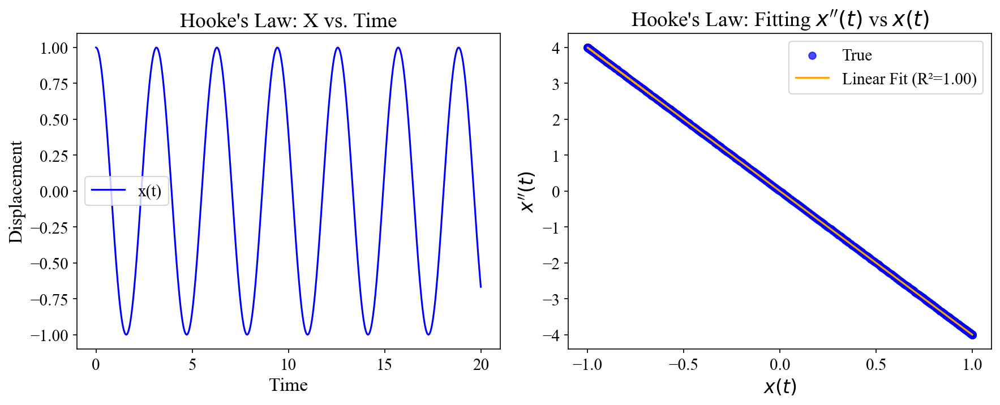

In [45]:
### Hooke's Law Simulation ###
# Parameters
t = np.linspace(0, 20, 500)

omega_hooke = 2  # Natural frequency
x_hooke = np.cos(omega_hooke * t).flatten()  # Displacement over time
x_ddot_hooke = -omega_hooke**2 * np.cos(omega_hooke * t).flatten()  # Acceleration



# Linear regression to find omega^2 for Hooke's law
lin_reg_hooke = LinearRegression()
lin_reg_hooke.fit(x_hooke.reshape(-1, 1), x_ddot_hooke)
omega_hooke_est = np.sqrt(-lin_reg_hooke.coef_[0])  # Calculate omega from the slope
r2_hooke = r2_score(x_ddot_hooke, lin_reg_hooke.predict(x_hooke.reshape(-1, 1)))

# Plot Hooke’s Law Results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
# Behavior over time
ax1.plot(t, x_hooke, color='b', label='x(t)')
ax1.set_title("Hooke's Law: X vs. Time")
ax1.set_xlabel('Time')
ax1.set_ylabel('Displacement')
ax1.legend()

# Fit results for Hooke's Law
ax2.scatter(x_hooke, x_ddot_hooke, color='b', alpha=0.7, label='True')
ax2.plot(x_hooke, lin_reg_hooke.predict(x_hooke.reshape(-1, 1)), color='orange', label=f'Linear Fit (R²={r2_hooke:.2f})')
ax2.set_title("Hooke's Law: Fitting $x''(t)$ vs $x(t)$")
ax2.set_xlabel('$x(t)$')
ax2.set_ylabel("$x''(t)$")
ax2.legend(loc='upper right')
# ax2.text(0.1, 0.1, f'Estimated ω = {omega_hooke_est:.2f}', transform=ax2.transAxes, fontsize=12, color='purple')

plt.tight_layout()
plt.show()

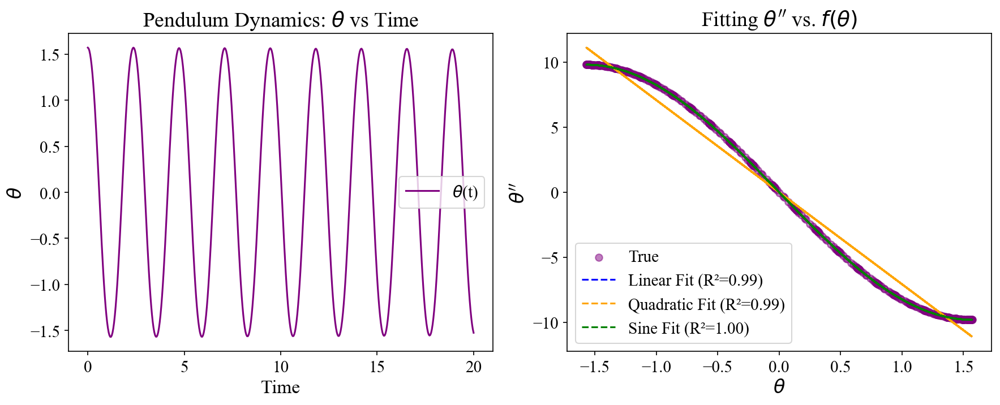

In [47]:
# Constants
g = 9.81  # Gravity (m/s^2)
L = 1   # Length of the pendulum (m)
omega_squared = g / L

# Initial conditions
theta0 = np.pi/2   # Large initial angle (to show need for sine basis)
theta_dot0 = 0

# Define the pendulum dynamics for solve_ivp
def pendulum_dynamics(t, y):
    theta, theta_dot = y
    theta_double_dot = -omega_squared * np.sin(theta)
    return [theta_dot, theta_double_dot]

# Time range for simulation
t_eval = np.linspace(0, 20, 500)

# Simulate the pendulum
sol = solve_ivp(pendulum_dynamics, [t_eval[0], t_eval[-1]], [theta0, theta_dot0], t_eval=t_eval)
theta = sol.y[0]
theta_double_dot = -omega_squared * np.sin(theta)  # True value of theta''

# Prepare data for regression (reshaping for scikit-learn compatibility)
theta = theta.reshape(-1, 1)
theta_double_dot = theta_double_dot.reshape(-1, 1)

# Fit models: Linear, Quadratic, and Sine
lin_reg = LinearRegression()
poly = PolynomialFeatures(degree=2)
theta_quad = poly.fit_transform(theta)

# Linear fit
lin_reg.fit(theta, theta_double_dot)
theta_double_dot_pred_linear = lin_reg.predict(theta)
r2_linear = r2_score(theta_double_dot, theta_double_dot_pred_linear)

# Quadratic fit
lin_reg.fit(theta_quad, theta_double_dot)
theta_double_dot_pred_quad = lin_reg.predict(theta_quad)
r2_quad = r2_score(theta_double_dot, theta_double_dot_pred_quad)

# Sine fit
sin_theta = np.sin(theta)
lin_reg.fit(sin_theta, theta_double_dot)
theta_double_dot_pred_sine = lin_reg.predict(sin_theta)
r2_sine = r2_score(theta_double_dot, theta_double_dot_pred_sine)

# Plotting results
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Subplot 1: Theta over time
axs[0].plot(t_eval, sol.y[0], label=r'$\theta$(t)', color='purple')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\theta$')
axs[0].set_title(r'Pendulum Dynamics: $\theta$ vs Time')
axs[0].legend()

# Subplot 2: Fitting $\theta''$ vs various functions of $\theta$
axs[1].scatter(theta, theta_double_dot, color='purple', alpha=0.5, label=r'True')
axs[1].plot(theta, theta_double_dot_pred_linear, color='blue', linestyle='--', label=f'Linear Fit (R²={r2_linear:.2f})')
axs[1].plot(theta, theta_double_dot_pred_quad, color='orange', linestyle='--', label=f'Quadratic Fit (R²={r2_quad:.2f})')
axs[1].plot(theta, theta_double_dot_pred_sine, color='green', linestyle='--', label=f'Sine Fit (R²={r2_sine:.2f})')

axs[1].set_xlabel(r'$\theta$')
axs[1].set_ylabel(r'$\theta^{\prime\prime}$')
axs[1].set_title(r'Fitting $\theta^{\prime\prime}$ vs. $f(\theta)$')
axs[1].legend(loc='lower left')

plt.tight_layout()
plt.show()

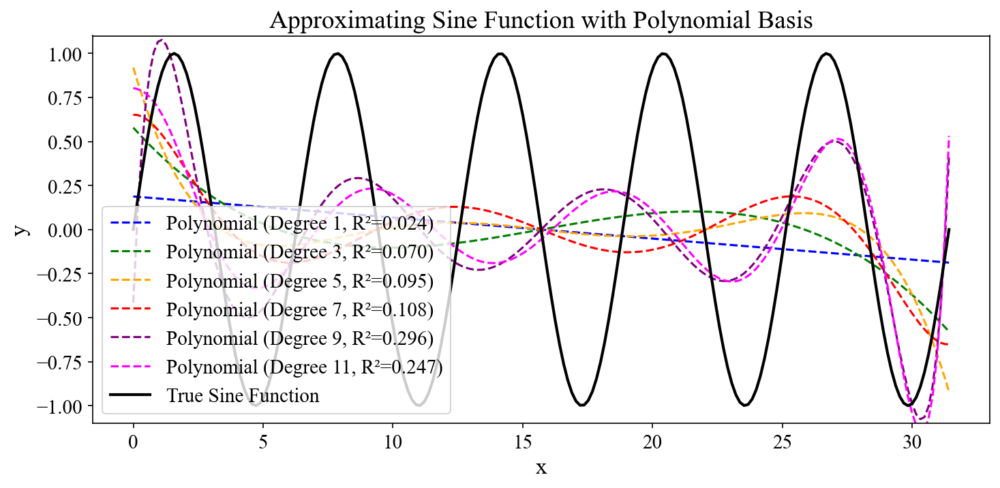

In [101]:
# Generate data points for a sine function
x = np.linspace(0, 10 * np.pi, 200).reshape(-1, 1)
y_true = np.sin(x)

# Initialize subplots
fig, axs = plt.subplots(1, 1, figsize=(10, 5))

# Plot 1: Polynomial Approximation of the Sine Function
degrees = [1, 3, 5, 7, 9, 11]  # Polynomial degrees to demonstrate increasing accuracy
colors = ['blue', 'green', 'orange', 'red', 'purple', 'magenta']

# Store R² values for each polynomial degree
r2_scores = []

for i, degree in enumerate(degrees):
    poly = PolynomialFeatures(degree=degree)
    x_poly = poly.fit_transform(x)
    
    # Fit polynomial regression
    lin_reg = LinearRegression()
    lin_reg.fit(x_poly, y_true)
    y_pred = lin_reg.predict(x_poly)
    r2 = r2_score(y_true, y_pred)
    r2_scores.append(r2)
    
    # Plot polynomial fit
    axs.plot(x, y_pred, color=colors[i], linestyle='--', label=f'Polynomial (Degree {degree}, R²={r2:.3f})')

# Plot the true sine function
axs.plot(x, y_true, color='black', linewidth=2, label='True Sine Function')
axs.set_title('Approximating Sine Function with Polynomial Basis')
axs.set_xlabel('x')
axs.set_ylabel('y')
axs.set_ylim(-1.1,1.1)
axs.legend(loc='lower left')

plt.tight_layout()
plt.show()

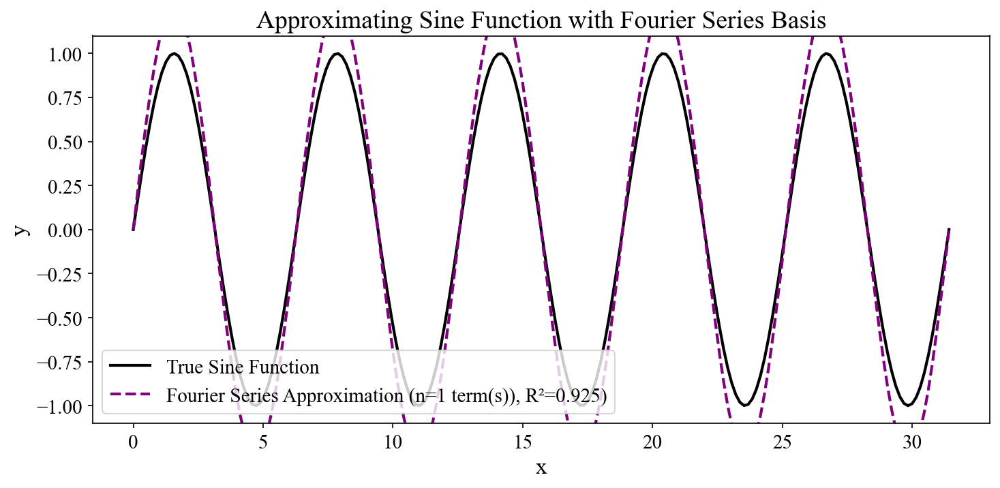

In [107]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5))

# Plot 2: Fourier Series Approximation of the Sine Function
# Fourier series terms for sine function (up to 1 terms)
fourier_series = np.zeros_like(y_true)
num_terms = 1
for n in range(1, num_terms + 1, 2):  # Only odd terms
    fourier_series += (4 / (np.pi * n)) * np.sin(n * x)

# Plot Fourier series approximation
axs.plot(x, y_true, color='black', linewidth=2, label='True Sine Function')
axs.plot(x, fourier_series, color='purple', linestyle='--', linewidth=2, label=f'Fourier Series Approximation (n={num_terms} term(s)), R²={r2_score(y_true, fourier_series):.3f})')
axs.set_title('Approximating Sine Function with Fourier Series Basis')
axs.set_xlabel('x')
axs.set_ylabel('y')
axs.set_ylim(-1.1,1.1)
axs.legend(loc='lower left')

plt.tight_layout()
plt.show()

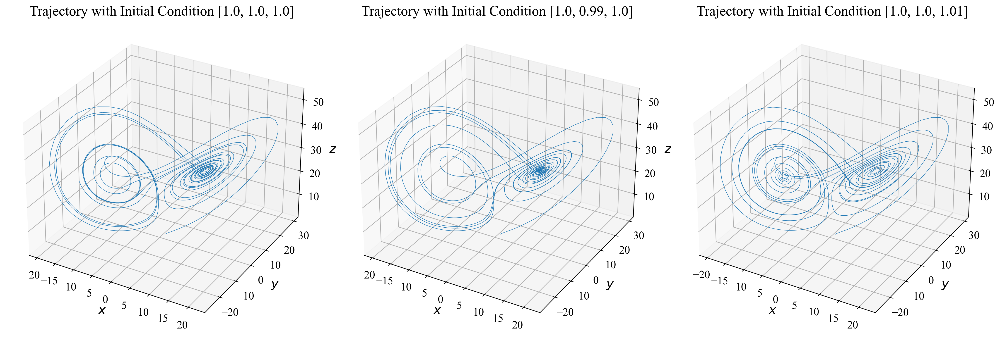

In [6]:
# Lorenz system parameters
sigma = 10.0
rho = 28.0
beta = 8.0 / 3.0

# Define the Lorenz system
def lorenz(state, t):
    x, y, z = state
    dx = sigma * (y - x)
    dy = x * (rho - z) - y
    dz = x * y - beta * z
    return np.array([dx, dy, dz])

# Simulation parameters
t_max = 20
dt = 0.01
t = np.arange(0, t_max, dt)

# Initial conditions
initial_conditions = [
    [1.0, 1.0, 1.0],
    [1.0, 0.99, 1.0],  # Slightly perturbed initial condition
    [1.0, 1.0, 1.01]  # Another slight perturbation
]

# Run simulation for each initial condition
trajectories = []
for initial_state in initial_conditions:
    state = np.array(initial_state)
    trajectory = [state]
    for _ in t[1:]:
        state = state + lorenz(state, t) * dt
        trajectory.append(state)
    trajectories.append(np.array(trajectory))

# Plotting the trajectories
fig = plt.figure(figsize=(18, 6))
for i, trajectory in enumerate(trajectories):
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')
    ax.plot(trajectory[:, 0], trajectory[:, 1], trajectory[:, 2], lw=0.5)
    ax.set_title(f'Trajectory with Initial Condition {initial_conditions[i]}')
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$y$')
    ax.set_zlabel(r'$z$')
# plt.suptitle("Lorenz Attractor with Different Initial Conditions", fontsize=16)
plt.tight_layout()
plt.show()

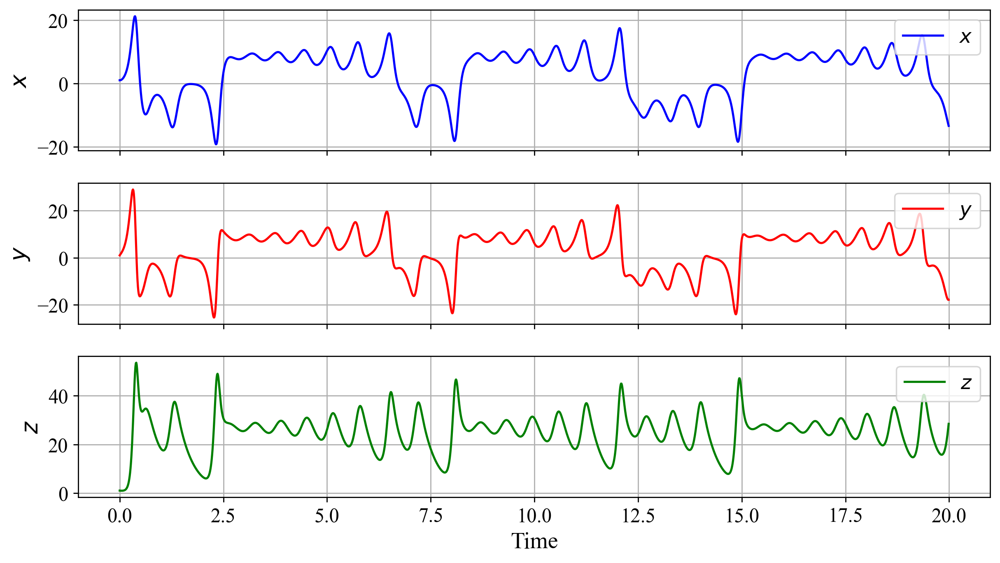

In [8]:
# Time series plot for each axis of the Lorenz attractor
fig, axes = plt.subplots(3, 1, figsize=(10, 6), sharex=True)

# Colors for each axis
colors = ['blue', 'red', 'green']
labels = [r'$x$', r'$y$', r'$z$']
labels_dot = [r'$\dot{x}$', r'$\dot{y}$', r'$\dot{z}$']

for i, (ax, color, label) in enumerate(zip(axes, colors, labels)):
    ax.plot(t, trajectories[0][:, i], color=color, label=label)
    ax.set_ylabel(label)
    ax.legend(loc='upper right')
    ax.grid(True)

# Label for x-axis
axes[-1].set_xlabel('Time')
# plt.suptitle("Lorenz Attractor Coordinates Over Time", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust to leave space for title
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.330e+03, tolerance: 3.568e+02
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.765e+03, tolerance: 8.825e+02
  model = cd_fast.enet_coordinate_descent(


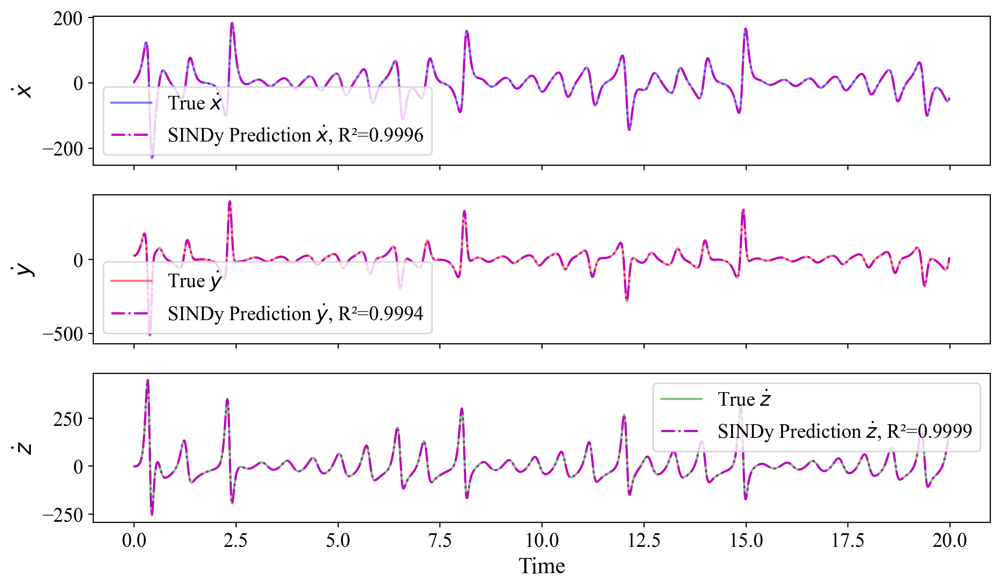

In [10]:
# Helper function to compute numerical derivatives
def compute_derivative(trajectory, dt):
    return np.gradient(trajectory, dt, axis=0)

# Prepare polynomial features for SINDy (up to degree 3 for example)
poly = PolynomialFeatures(degree=3, include_bias=False)
X = poly.fit_transform(trajectories[0])  # Using the first trajectory for training

# Compute derivatives for each dimension
dx_dt = compute_derivative(trajectories[0][:, 0], dt)
dy_dt = compute_derivative(trajectories[0][:, 1], dt)
dz_dt = compute_derivative(trajectories[0][:, 2], dt)
derivatives = np.vstack([dx_dt, dy_dt, dz_dt]).T

# Sparse regression for each dimension (Lasso for sparsity)
lasso_x = Lasso(alpha=0.02)  # Regularization term for sparsity
lasso_y = Lasso(alpha=0.02)
lasso_z = Lasso(alpha=0.02)
lasso_x.fit(X, dx_dt)
lasso_y.fit(X, dy_dt)
lasso_z.fit(X, dz_dt)

# SINDy model predictions (dot product of coefficients with polynomial terms)
dx_pred = lasso_x.predict(X)
dy_pred = lasso_y.predict(X)
dz_pred = lasso_z.predict(X)

# Plotting original and predicted derivatives
fig, axs = plt.subplots(3, 1, figsize=(10, 6), sharex=True)
time_axis = t[:len(dx_dt)]

axs[0].plot(time_axis, dx_dt, colors[0], label=r'True $\dot{x}$', alpha=0.5)
axs[0].plot(time_axis, dx_pred, 'm-.', label=r"SINDy Prediction $\dot{x}$, R²="+str(round(r2_score(dx_dt, dx_pred),4)))
axs[0].set_ylabel("$\\dot{x}$")
axs[0].legend()

axs[1].plot(time_axis, dy_dt, colors[1], label="True $\\dot{y}$", alpha=0.5)
axs[1].plot(time_axis, dy_pred, 'm-.', label="SINDy Prediction $\\dot{y}$, R²="+str(round(r2_score(dy_dt, dy_pred),4)))
axs[1].set_ylabel("$\\dot{y}$")
axs[1].legend()

axs[2].plot(time_axis, dz_dt, colors[2], label="True $\\dot{z}$", alpha=0.5)
axs[2].plot(time_axis, dz_pred, 'm-.', label="SINDy Prediction $\\dot{z}$, R²="+str(round(r2_score(dz_dt, dz_pred),4)))
axs[2].set_ylabel("$\\dot{z}$")
axs[2].legend()

plt.xlabel("Time")
# plt.suptitle("SINDy Fit to Lorenz System Derivatives", fontsize=16)
plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.208e+06, tolerance: 1.395e+03
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.079e+06, tolerance: 1.883e+03
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.193e+06, toler

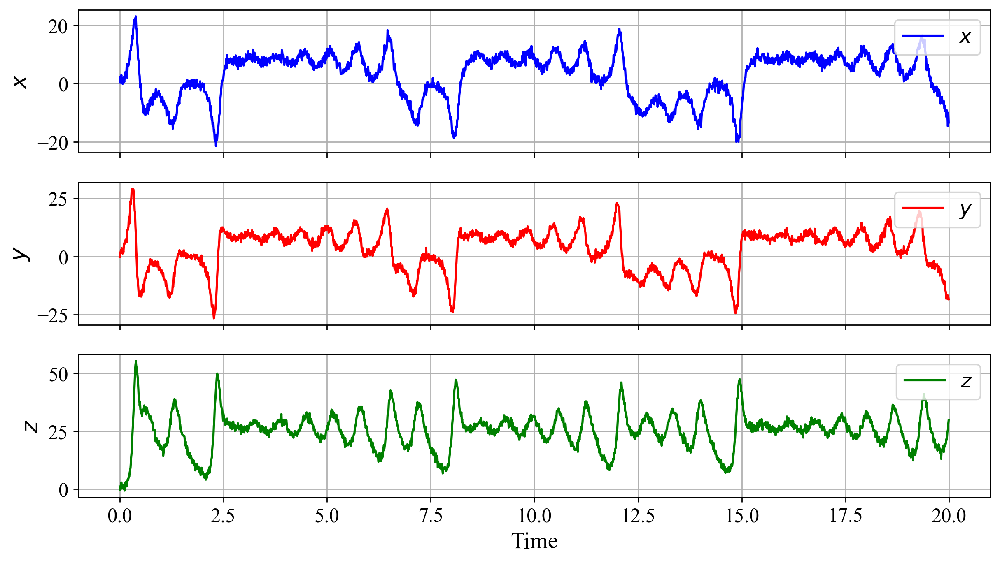

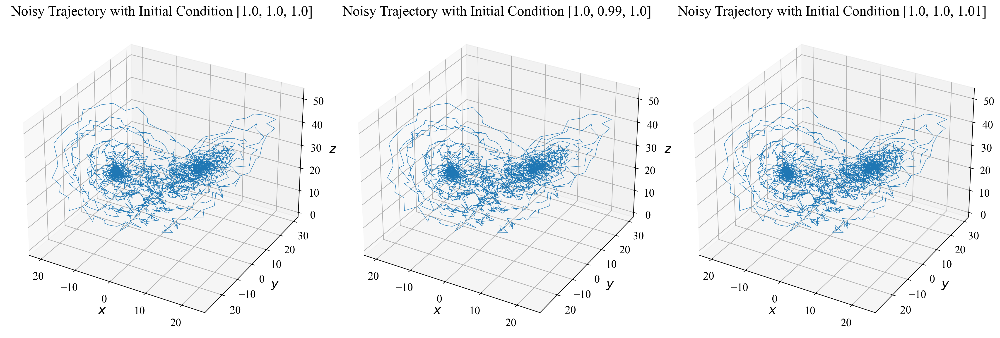

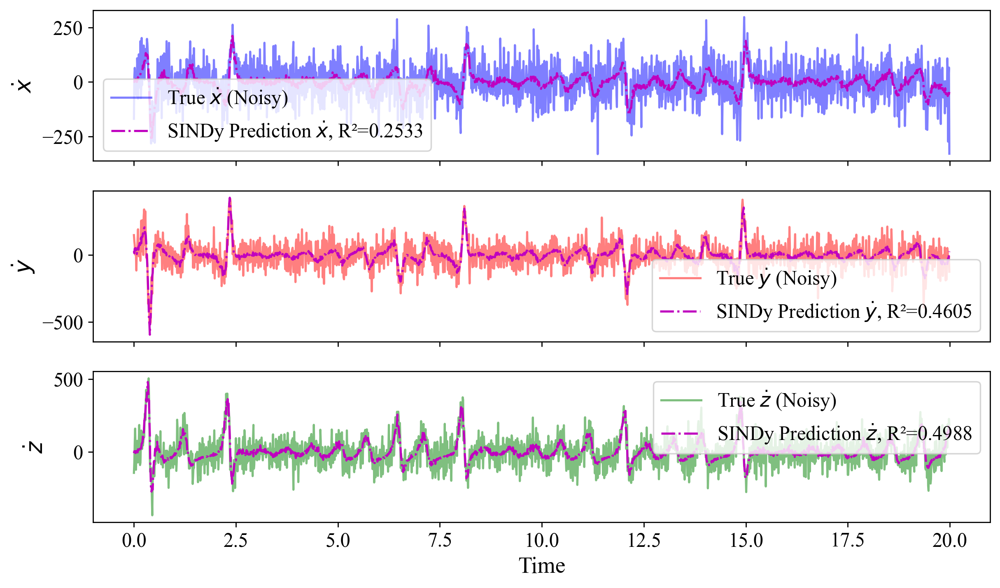

In [12]:
# Set the noise level (you can adjust this value)
noise_level = 1.0

# Add noise to the Lorenz trajectories
noisy_trajectories = []
for trajectory in trajectories:
    noise = np.random.normal(0, noise_level, trajectory.shape)
    noisy_trajectory = trajectory + noise
    noisy_trajectories.append(noisy_trajectory)

# Prepare polynomial features for SINDy on the noisy data
poly_noisy = PolynomialFeatures(degree=3, include_bias=False)
X_noisy = poly_noisy.fit_transform(noisy_trajectories[0])  # Using the first noisy trajectory for training

# Compute derivatives for each dimension from the noisy data
dx_noisy_dt = compute_derivative(noisy_trajectories[0][:, 0], dt)
dy_noisy_dt = compute_derivative(noisy_trajectories[0][:, 1], dt)
dz_noisy_dt = compute_derivative(noisy_trajectories[0][:, 2], dt)
derivatives_noisy = np.vstack([dx_noisy_dt, dy_noisy_dt, dz_noisy_dt]).T

# Sparse regression for each dimension on the noisy data (Lasso for sparsity)
lasso_x_noisy = Lasso(alpha=0.02)
lasso_y_noisy = Lasso(alpha=0.02)
lasso_z_noisy = Lasso(alpha=0.02)
lasso_x_noisy.fit(X_noisy, dx_noisy_dt)
lasso_y_noisy.fit(X_noisy, dy_noisy_dt)
lasso_z_noisy.fit(X_noisy, dz_noisy_dt)

# SINDy model predictions (dot product of coefficients with polynomial terms for noisy data)
dx_noisy_pred = lasso_x_noisy.predict(X_noisy)
dy_noisy_pred = lasso_y_noisy.predict(X_noisy)
dz_noisy_pred = lasso_z_noisy.predict(X_noisy)


# Time series plot for each axis of the Lorenz attractor
fig, axes = plt.subplots(3, 1, figsize=(10, 6), sharex=True)


for i, (ax, color, label) in enumerate(zip(axes, colors, labels)):
    ax.plot(t, noisy_trajectories[0][:, i], color=color, label=label)
    ax.set_ylabel(label)
    ax.legend(loc='upper right')
    ax.grid(True)

# Label for x-axis
axes[-1].set_xlabel('Time')
# plt.suptitle("Lorenz Attractor Coordinates Over Time", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust to leave space for title
plt.show()

# Plotting the trajectories
fig = plt.figure(figsize=(18, 6))
for i, trajectory in enumerate(trajectories):
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')
    ax.plot(noisy_trajectory[:, 0], noisy_trajectory[:, 1], noisy_trajectory[:, 2], lw=0.5)
    ax.set_title(f'Noisy Trajectory with Initial Condition {initial_conditions[i]}')
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$y$')
    ax.set_zlabel(r'$z$')
# plt.suptitle("Lorenz Attractor with Different Initial Conditions", fontsize=16)
plt.tight_layout()
plt.show()

# Plotting original and predicted derivatives for noisy data
fig, axs = plt.subplots(3, 1, figsize=(10, 6), sharex=True)
time_axis_noisy = t[:len(dx_noisy_dt)]

# Plot for dx
axs[0].plot(time_axis_noisy, dx_noisy_dt, colors[0], label=r'True $\dot{x}$ (Noisy)', alpha=0.5)
axs[0].plot(time_axis_noisy, dx_noisy_pred, 'm-.', label=r"SINDy Prediction $\dot{x}$, R²="+str(round(r2_score(dx_noisy_dt, dx_noisy_pred), 4)))
axs[0].set_ylabel("$\\dot{x}$")
axs[0].legend()

# Plot for dy
axs[1].plot(time_axis_noisy, dy_noisy_dt, colors[1], label="True $\\dot{y}$ (Noisy)", alpha=0.5)
axs[1].plot(time_axis_noisy, dy_noisy_pred, 'm-.', label="SINDy Prediction $\\dot{y}$, R²="+str(round(r2_score(dy_noisy_dt, dy_noisy_pred), 4)))
axs[1].set_ylabel("$\\dot{y}$")
axs[1].legend()

# Plot for dz
axs[2].plot(time_axis_noisy, dz_noisy_dt, colors[2], label="True $\\dot{z}$ (Noisy)", alpha=0.5)
axs[2].plot(time_axis_noisy, dz_noisy_pred, 'm-.', label="SINDy Prediction $\\dot{z}$, R²="+str(round(r2_score(dz_noisy_dt, dz_noisy_pred), 4)))
axs[2].set_ylabel("$\\dot{z}$")
axs[2].legend()

plt.xlabel("Time")
# plt.suptitle("SINDy Fit to Noisy Lorenz System Derivatives", fontsize=16)
plt.tight_layout()
plt.show()


In [68]:
# Train and predict with ReservoirPy
rho_values = [0.5, 0.99, 1.3]  # Below, at, and above criticality
predictions = []
W_lst = []
for rho in rho_values:
    # Create a reservoir
    reservoir = Reservoir(units=5000, lr=0.6, sr=rho)
    readout = Ridge(ridge=1e-8)
    # print((readout.fit(reservoir.run(noisy_trajectory),derivatives_noisy)))
    esn = reservoir >> readout
    esn = esn.fit(noisy_trajectory, derivatives_noisy)
    pred = esn.run(noisy_trajectory)

    predictions.append(pred)
    W_lst.append(reservoir.params['W'].todense())


Running Model-3:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-3: 29it [00:00, 283.40it/s]             
Running Model-3: 58it [00:00, 271.48it/s]
Running Model-3: 102it [00:00, 344.58it/s]
Running Model-3: 144it [00:00, 370.83it/s]
Running Model-3: 189it [00:00, 396.54it/s]
Running Model-3: 234it [00:00, 412.78it/s]
Running Model-3: 276it [00:00, 365.05it/s]
Running Model-3: 314it [00:00, 362.89it/s]
Running Model-3: 358it [00:00, 385.01it/s]
Running Model-3: 400it [00:01, 393.60it/s]
Running Model-3: 444it [00:01, 407.08it/s]
Running Model-3: 489it [00:01, 417.33it/s]
Running Model-3: 533it [00:01, 422.25it/s]
Running Model-3: 577it [00:01, 426.84it/s]
Running Model-3: 620it [00:01, 423.64it/s]
Running Model-3: 665it [00:01, 429.96it/s]
Running Model-3: 710it [00:01, 433.80it/s]
Running Model-3: 754it [00:01, 428.72it/s]
Running Model-3: 798it [00:01, 429.58it/s]
Running Model-3: 841it [00:02, 429.61it/s]
Running Model-3: 885it [00:02, 430.68it/s]
Running Model-3: 929it [00:02, 

Fitting node Ridge-3...


Running Model-3: 2000it [00:04, 406.86it/s]           
Running Model-4:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-4: 29it [00:00, 283.50it/s]             
Running Model-4: 58it [00:00, 197.60it/s]
Running Model-4: 96it [00:00, 263.55it/s]
Running Model-4: 134it [00:00, 301.97it/s]
Running Model-4: 173it [00:00, 328.25it/s]
Running Model-4: 212it [00:00, 345.02it/s]
Running Model-4: 251it [00:00, 358.28it/s]
Running Model-4: 289it [00:00, 363.59it/s]
Running Model-4: 326it [00:00, 363.08it/s]
Running Model-4: 363it [00:01, 364.56it/s]
Running Model-4: 400it [00:01, 365.92it/s]
Running Model-4: 439it [00:01, 372.26it/s]
Running Model-4: 477it [00:01, 373.89it/s]
Running Model-4: 515it [00:01, 371.55it/s]
Running Model-4: 554it [00:01, 374.86it/s]
Running Model-4: 592it [00:01, 374.09it/s]
Running Model-4: 630it [00:01, 373.24it/s]
Running Model-4: 669it [00:01, 376.54it/s]
Running Model-4: 707it [00:02, 376.97it/s]
Running Model-4: 745it [00:02, 376.76it/s]
Running Model-4: 784

Fitting node Ridge-4...


Running Model-4: 2000it [00:05, 389.05it/s]           
Running Model-5:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-5: 30it [00:00, 294.11it/s]             
Running Model-5: 60it [00:00, 270.50it/s]
Running Model-5: 95it [00:00, 303.41it/s]
Running Model-5: 135it [00:00, 339.28it/s]
Running Model-5: 176it [00:00, 360.92it/s]
Running Model-5: 217it [00:00, 375.84it/s]
Running Model-5: 256it [00:00, 378.57it/s]
Running Model-5: 296it [00:00, 384.87it/s]
Running Model-5: 336it [00:00, 389.19it/s]
Running Model-5: 377it [00:01, 393.34it/s]
Running Model-5: 417it [00:01, 393.90it/s]
Running Model-5: 457it [00:01, 394.31it/s]
Running Model-5: 498it [00:01, 396.77it/s]
Running Model-5: 538it [00:01, 396.77it/s]
Running Model-5: 578it [00:01, 394.77it/s]
Running Model-5: 618it [00:01, 393.29it/s]
Running Model-5: 658it [00:01, 394.69it/s]
Running Model-5: 698it [00:01, 394.54it/s]
Running Model-5: 738it [00:01, 393.07it/s]
Running Model-5: 778it [00:02, 389.58it/s]
Running Model-5: 817

Fitting node Ridge-5...


/opt/anaconda3/lib/python3.12/site-packages/reservoirpy/nodes/readouts/ridge.py:17: LinAlgWarning: Ill-conditioned matrix (rcond=9.3331e-17): result may not be accurate.
  return linalg.solve(XXT + ridge, YXT.T, assume_a="sym")
Running Model-5: 2000it [00:04, 404.81it/s]           


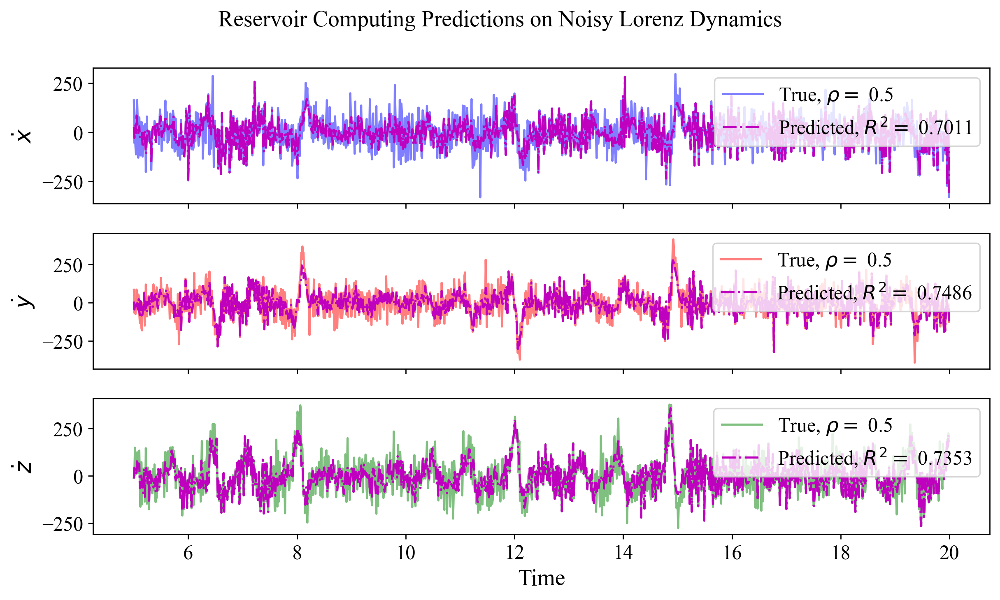

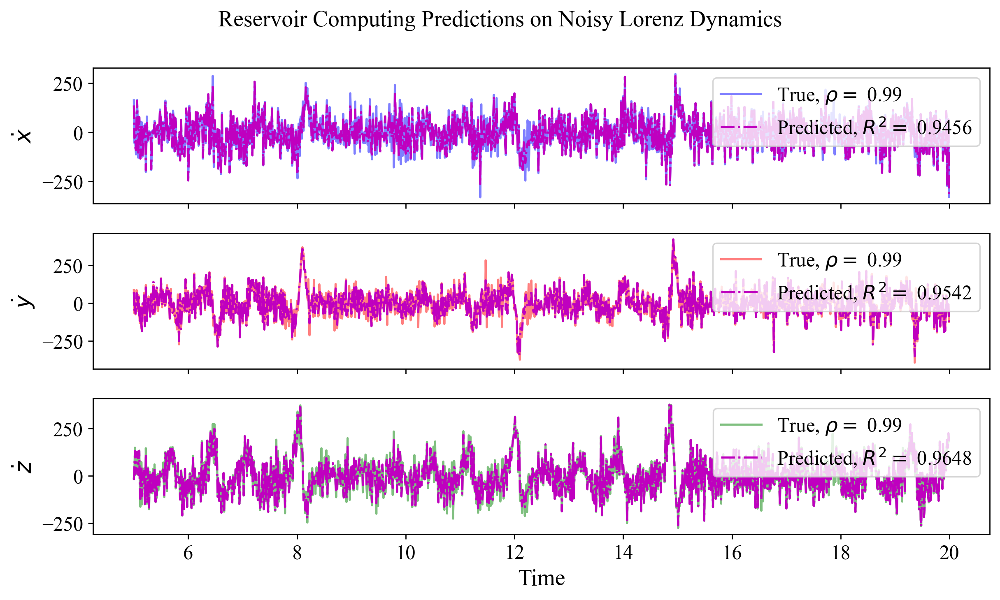

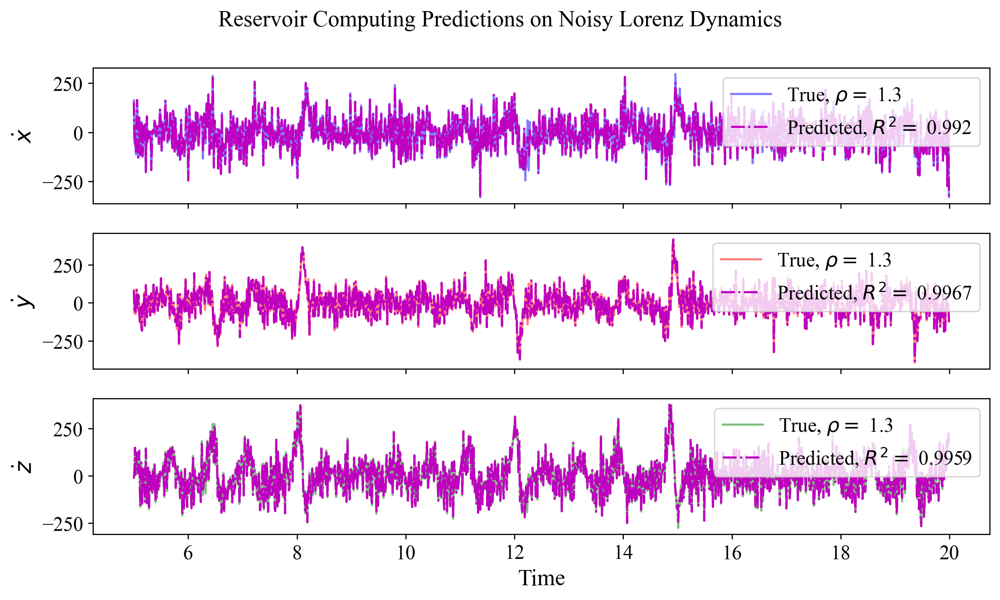

In [70]:
buf = 500
for i in range(len(rho_values)):
    # Plotting the results
    fig, axs = plt.subplots(3, 1, figsize=(10, 6), sharex=True)
    time_axis = np.arange(0, noisy_trajectory.shape[0] * dt, dt)
    for j in range(3):
        axs[j].plot(time_axis[buf:], derivatives_noisy[buf:, j], colors[j], label=r'True, $\rho =$ '+str(rho_values[i]), alpha=0.5)
        axs[j].plot(time_axis[buf:], predictions[i][buf:, j], 'm-.', label=r'Predicted, $R^2 =$ '+str(round(r2_score(derivatives_noisy[buf:,j],predictions[i][buf:,j]),4)))
        axs[j].set_ylabel(labels_dot[j])
        axs[j].legend(loc='upper right')
    
    plt.xlabel("Time")
    plt.suptitle("Reservoir Computing Predictions on Noisy Lorenz Dynamics", fontsize=16)
    plt.tight_layout()
    plt.show()



In [72]:
# Convert to dense format if the matrix is sparse, choose one of the Ws
W_dense = W_lst[0]

# Calculate eigenvalues
eigenvalues = np.linalg.eigvals(W_dense)

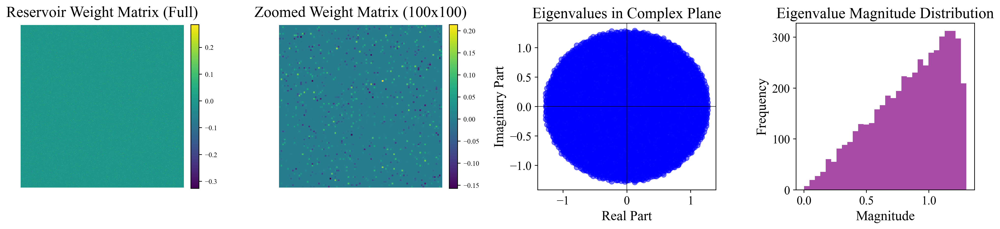

In [898]:
# Set up a 1x4 grid of subplots
fig, axs = plt.subplots(1, 4, figsize=(16, 4))

# Plot 1: Original weight matrix (full)
im1 = axs[0].matshow(W_dense, cmap='viridis')
axs[0].set_title("Reservoir Weight Matrix (Full)",y=1.02)
axs[0].axis('off')  # Turn off axis
# Add colorbar matching the height of the plot
cbar1 = fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)
cbar1.ax.tick_params(labelsize=8)

# Plot 2: Zoomed-in version of weight matrix (100x100)
im2 = axs[1].matshow(W_dense[:100, :100], cmap='viridis')
axs[1].set_title("Zoomed Weight Matrix (100x100)", y=1.02)
axs[1].axis('off')
# Add colorbar matching the height of the plot
cbar2 = fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)
cbar2.ax.tick_params(labelsize=8)

# Plot 3: Eigenvalues in the complex plane
axs[2].scatter(eigenvalues.real, eigenvalues.imag, color='b', alpha=0.5)
axs[2].axhline(0, color='black', linewidth=0.5)
axs[2].axvline(0, color='black', linewidth=0.5)
axs[2].set_xlabel("Real Part")
axs[2].set_ylabel("Imaginary Part")
axs[2].set_title("Eigenvalues in Complex Plane")

# Plot 4: Histogram of eigenvalue magnitudes
axs[3].hist(np.abs(eigenvalues), bins=30, color='purple', alpha=0.7)
axs[3].set_xlabel("Magnitude")
axs[3].set_ylabel("Frequency")
axs[3].set_title("Eigenvalue Magnitude Distribution")

# Adjust layout
plt.tight_layout()
plt.show()

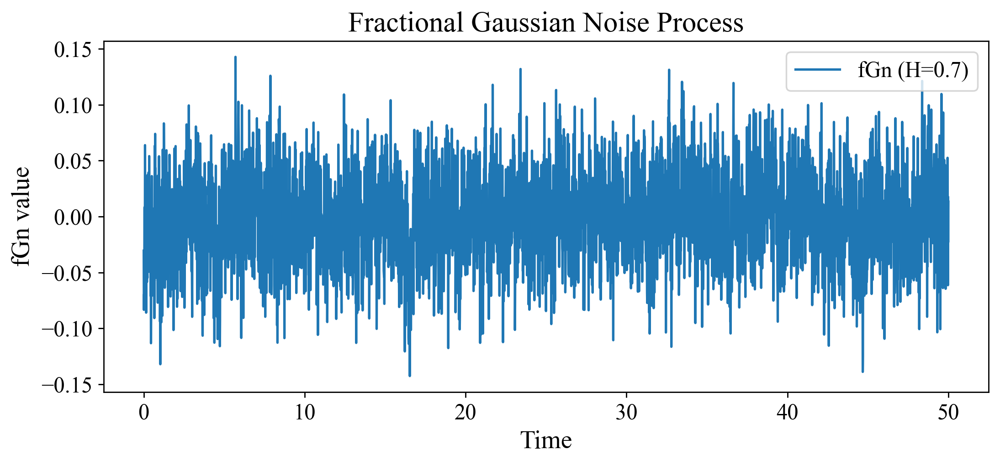

In [18]:
# Parameters for fGn
hurst_exponent = 0.7  # Memory strength (H > 0.5 indicates positive correlation, H < 0.5 anti-correlated)
n_steps = 5000        # Number of time steps
delta_t = 0.01        # Time interval

# Generate fGn process
fgn_process = FBM(n=n_steps, hurst=hurst_exponent, length=n_steps * delta_t, method='daviesharte').fgn()

# Plot the fGn process
time_axis = np.linspace(0, n_steps * delta_t, n_steps)
plt.figure(figsize=(10, 4))
plt.plot(time_axis, fgn_process, label=f'fGn (H={hurst_exponent})')
plt.xlabel('Time')
plt.ylabel('fGn value')
plt.title('Fractional Gaussian Noise Process')
plt.legend()
plt.show()

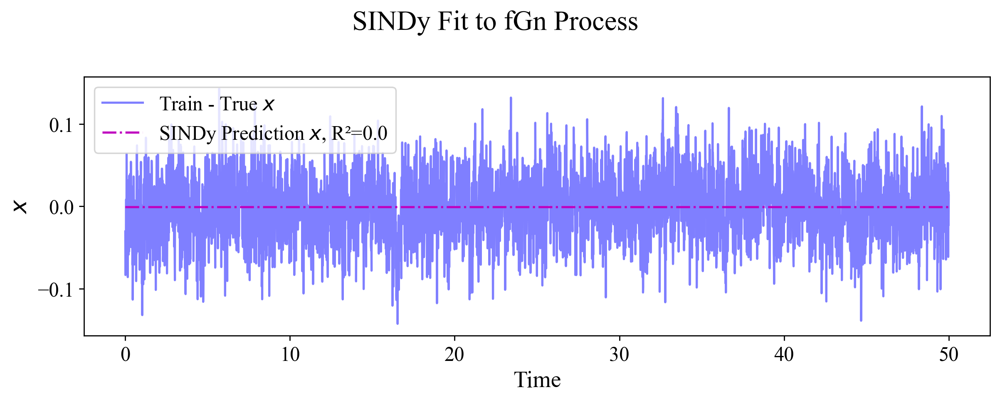

In [24]:
# Prepare polynomial features for SINDy (up to degree 3 for example)
poly = PolynomialFeatures(degree=10, include_bias=False)
X = poly.fit_transform(fgn_process.reshape(-1, 1))  # Reshape to fit the model input requirements

# Sparse regression for fGn (Lasso for sparsity)
lasso_x = Lasso(alpha=0.02)  # Regularization term for sparsity
lasso_x.fit(X[:n_steps], fgn_process[:n_steps].reshape(-1, 1))

# SINDy model predictions (dot product of coefficients with polynomial terms)
x_train = lasso_x.predict(X[:n_steps])

# Plotting original and predicted derivatives
fig, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True, sharey=True)
ax.plot(time_axis[:n_steps], fgn_process[:n_steps].reshape(-1, 1), label=r'Train - True $x$', alpha=0.5, color='blue')
ax.plot(time_axis[:n_steps], x_train, 'm-.', label=r"SINDy Prediction $x$, R²="+str(round(r2_score(fgn_process[:n_steps].reshape(-1, 1), x_train),4)))
ax.set_ylabel("$x$")
ax.set_xlabel("Time")
ax.legend()
plt.suptitle("SINDy Fit to fGn Process")
plt.tight_layout()
plt.show()